In [1]:
%matplotlib inline

import datacube
import matplotlib.pyplot as plt
import xarray as xr
import sys
sys.path.insert(1, '../tools/')

from tools.datahandling import load_ard, mostcommon_crs
from tools.plotting import rgb
from tools.bandindices import calculate_indices
from odc.ui import with_ui_cbk

In [2]:
dc = datacube.Datacube(app='Sentinel-2')

In [3]:
lat, lon = 30.5, 31.7
buffer = 0.125

# Create a reusable query
query = {
    'x': (lon-buffer, lon+buffer),
    'y': (lat+buffer, lat-buffer),
    'time': ('2022-01-01', '2022-01-31'),
    'resolution': (-30, 30)
}

# Identify the most common projection system in the input query
output_crs = mostcommon_crs(dc=dc, product='s2_l2a', query=query)

# Load available data from Sentinel-2 and filter to retain only times
# with at least 90% good data
ds = load_ard(dc=dc, 
              products=['s2_l2a'],
              min_gooddata=0.9, 
              measurements=['red', 'green', 'blue', 'red_edge_1', 'red_edge_2', 'red_edge_3', 'nir'],
              output_crs=output_crs,
              progress_cbk=with_ui_cbk(),
              **query)

Using pixel quality parameters for Sentinel 2
Finding datasets
    s2_l2a
Counting good quality pixels for each time step
Filtering to 4 out of 6 time steps with at least 90.0% good quality pixels
Applying pixel quality/cloud mask
Loading 4 time steps


In [4]:
print(ds)

<xarray.Dataset>
Dimensions:      (time: 4, y: 934, x: 811)
Coordinates:
  * time         (time) datetime64[ns] 2022-01-03T08:41:48 ... 2022-01-23T08:...
  * y            (y) float64 3.389e+06 3.389e+06 ... 3.361e+06 3.361e+06
  * x            (x) float64 3.631e+05 3.631e+05 ... 3.873e+05 3.874e+05
    spatial_ref  int32 32636
Data variables:
    red          (time, y, x) float32 286.0 401.0 355.0 ... 2.137e+03 2.744e+03
    green        (time, y, x) float32 823.0 777.0 810.0 ... 1.641e+03 2.033e+03
    blue         (time, y, x) float32 403.0 425.0 407.0 ... 1.068e+03 1.192e+03
    red_edge_1   (time, y, x) float32 1.316e+03 1.163e+03 ... 2.984e+03
    red_edge_2   (time, y, x) float32 4.806e+03 3.641e+03 ... 3.045e+03
    red_edge_3   (time, y, x) float32 5.699e+03 4.345e+03 ... 3.019e+03
    nir          (time, y, x) float32 5.526e+03 4.296e+03 ... 3.364e+03
Attributes:
    crs:           epsg:32636
    grid_mapping:  spatial_ref


/usr/local/lib/python3.8/dist-packages/matplotlib/cm.py:478: RuntimeWarning: invalid value encountered in cast
  xx = (xx * 255).astype(np.uint8)


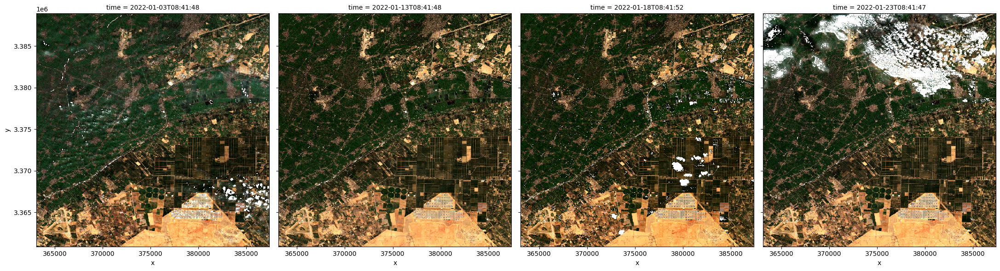

In [5]:
# Plot as an RGB image
rgb(ds, col='time')

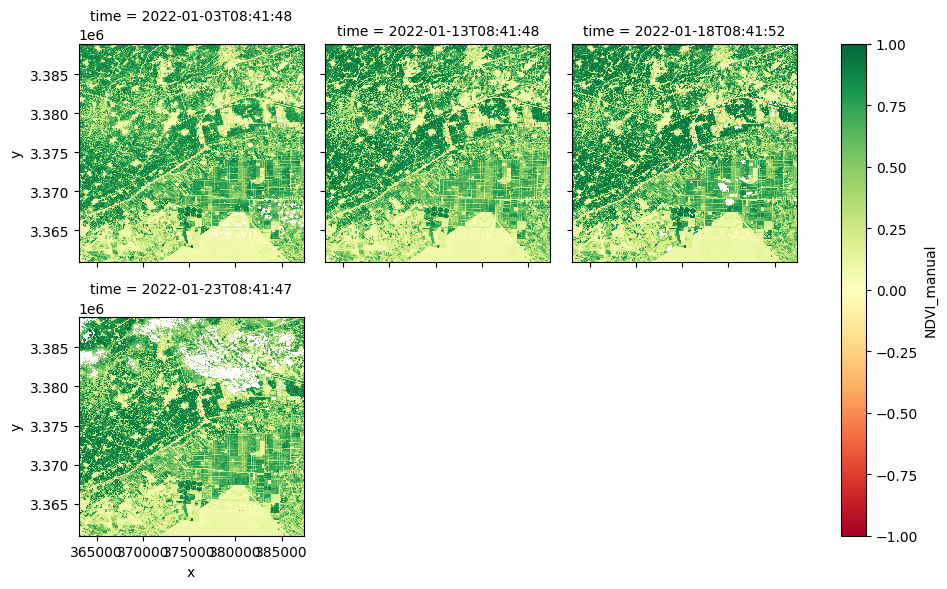

In [6]:
# Calculate NDVI using the formula above
ds['NDVI_manual'] = (ds.nir - ds.red) / (ds.nir + ds.red)

# Plot the results for one time step to see what they look like:
ds.NDVI_manual.plot(col='time', vmin=-1, vmax=1, cmap='RdYlGn', col_wrap=3)

In [7]:
calculate_indices(ds, index=['NDVI'], satellite_mission='s2')

<xarray.Dataset>
Dimensions:      (time: 4, y: 934, x: 811)
Coordinates:
  * time         (time) datetime64[ns] 2022-01-03T08:41:48 ... 2022-01-23T08:...
  * y            (y) float64 3.389e+06 3.389e+06 ... 3.361e+06 3.361e+06
  * x            (x) float64 3.631e+05 3.631e+05 ... 3.873e+05 3.874e+05
    spatial_ref  int32 32636
Data variables:
    red          (time, y, x) float32 286.0 401.0 355.0 ... 2.137e+03 2.744e+03
    green        (time, y, x) float32 823.0 777.0 810.0 ... 1.641e+03 2.033e+03
    blue         (time, y, x) float32 403.0 425.0 407.0 ... 1.068e+03 1.192e+03
    red_edge_1   (time, y, x) float32 1.316e+03 1.163e+03 ... 2.984e+03
    red_edge_2   (time, y, x) float32 4.806e+03 3.641e+03 ... 3.045e+03
    red_edge_3   (time, y, x) float32 5.699e+03 4.345e+03 ... 3.019e+03
    nir          (time, y, x) float32 5.526e+03 4.296e+03 ... 3.364e+03
    NDVI_manual  (time, y, x) float32 0.9016 0.8293 0.8677 ... 0.1822 0.1015
    NDVI         (time, y, x) float32 0.9016 0.8293 0.8677 ... 0.1822 0.1015
Attributes:
    crs:           epsg:32636
    grid_mapping:  spatial_ref

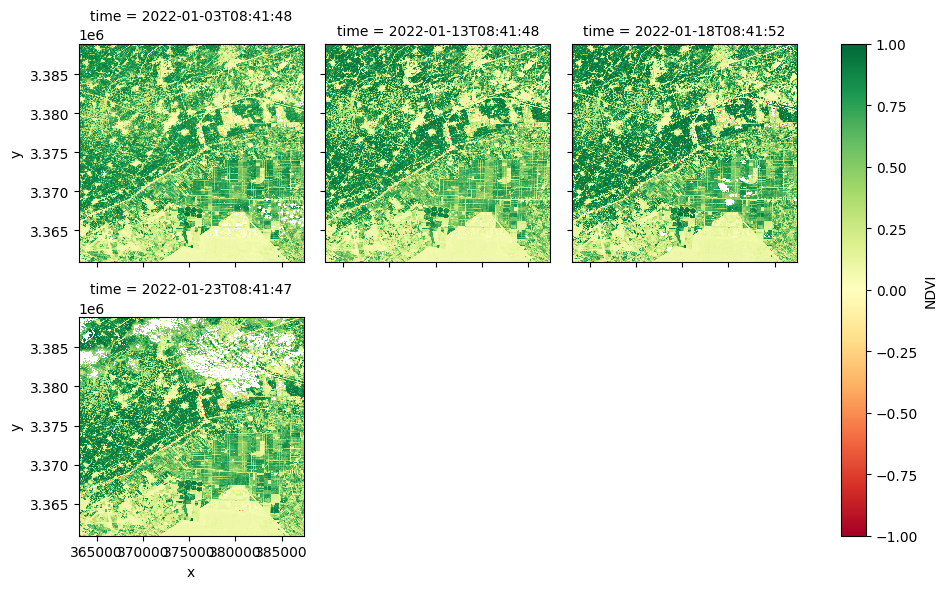

In [8]:
# Calculate NDVI using `calculate indices`
ds_ndvi = calculate_indices(ds, index='NDVI', satellite_mission='s2')

# Plot the results 
ds_ndvi.NDVI.plot(col='time', vmin=-1, vmax=1, cmap='RdYlGn', col_wrap=3)

In [9]:
# Calculate multiple indices
ds_multi = calculate_indices(ds, index=['NDVI', 'NDCI', 'IRECI', 'MTCI', 'OTCI', 'MCARI',
                                        'CI_RedEdge', 'CI_GreenEdge', 'TCARI', 'OSAVI', 'TCARI_OSAVI']
                             , satellite_mission='s2')

print(ds_multi)

<xarray.Dataset>
Dimensions:       (time: 4, y: 934, x: 811)
Coordinates:
  * time          (time) datetime64[ns] 2022-01-03T08:41:48 ... 2022-01-23T08...
  * y             (y) float64 3.389e+06 3.389e+06 ... 3.361e+06 3.361e+06
  * x             (x) float64 3.631e+05 3.631e+05 ... 3.873e+05 3.874e+05
    spatial_ref   int32 32636
Data variables: (12/19)
    red           (time, y, x) float32 286.0 401.0 355.0 ... 2.137e+03 2.744e+03
    green         (time, y, x) float32 823.0 777.0 810.0 ... 1.641e+03 2.033e+03
    blue          (time, y, x) float32 403.0 425.0 407.0 ... 1.068e+03 1.192e+03
    red_edge_1    (time, y, x) float32 1.316e+03 1.163e+03 ... 2.984e+03
    red_edge_2    (time, y, x) float32 4.806e+03 3.641e+03 ... 3.045e+03
    red_edge_3    (time, y, x) float32 5.699e+03 4.345e+03 ... 3.019e+03
    ...            ...
    MCARI         (time, y, x) float32 0.1009 0.07354 ... 0.02108 0.00651
    CI_RedEdge    (time, y, x) float32 3.331 2.736 2.765 ... 0.2233 0.01173
    CI_G

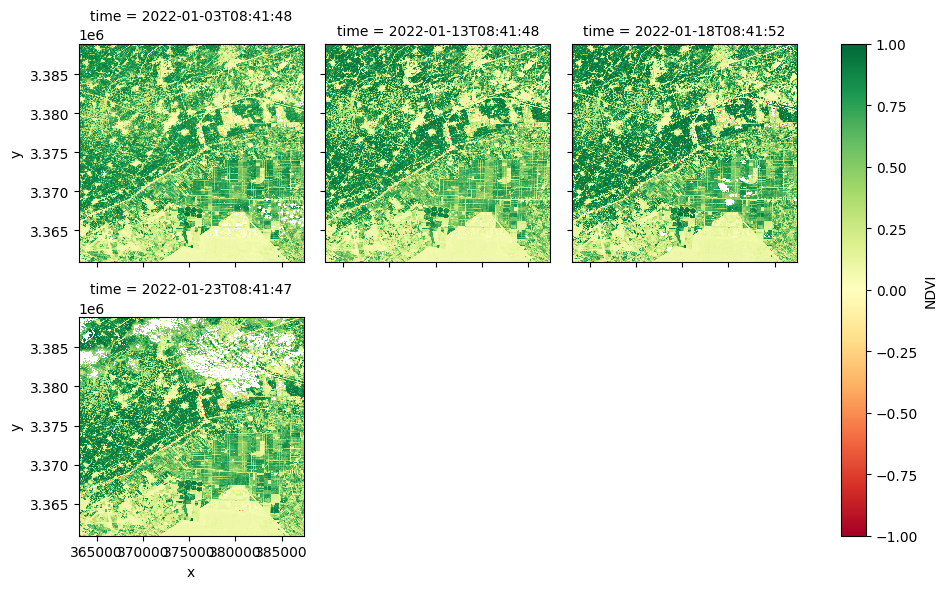

In [10]:
# Plot the NDVI results 
ds_multi.NDVI.plot(col='time',vmin=-1, vmax=1, robust=True, cmap='RdYlGn', col_wrap=3)

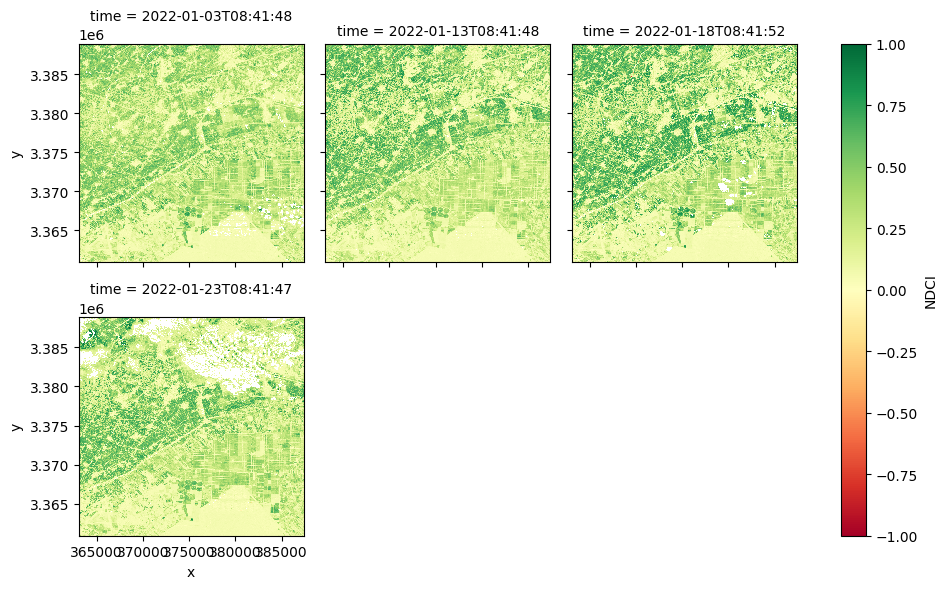

In [11]:
# Plot the NDCI results 
ds_multi.NDCI.plot(col='time',vmin=-1, vmax=1, robust=True, cmap='RdYlGn', col_wrap=3)

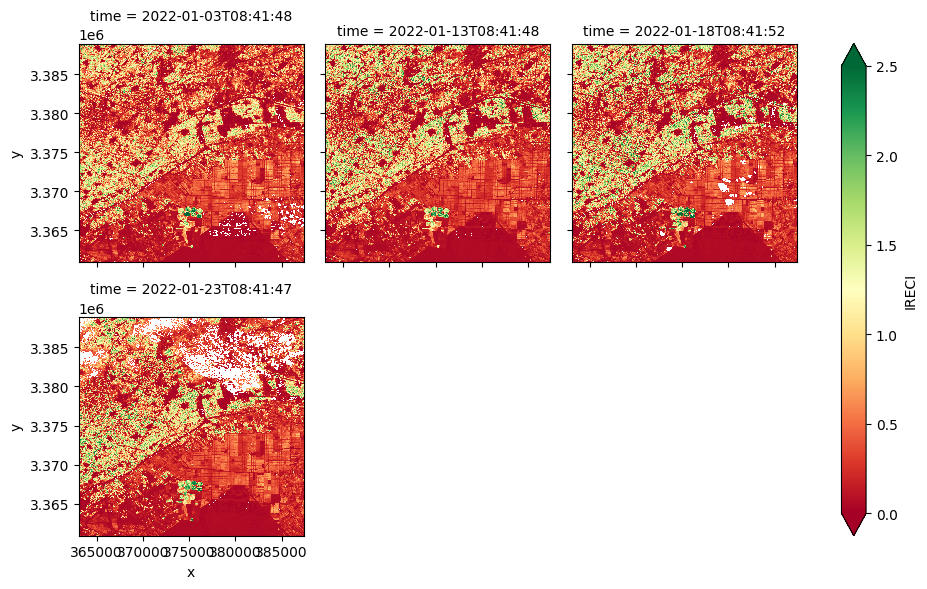

In [12]:
# Plot the IRECI results 
ds_multi.IRECI.plot(col='time', vmin=0, vmax=2.5,robust=True, cmap='RdYlGn', col_wrap=3)

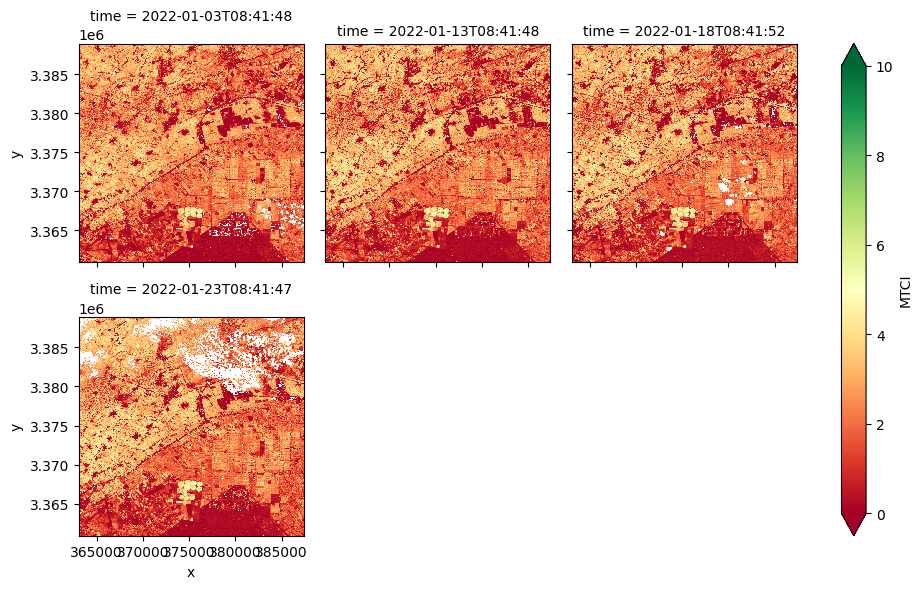

In [13]:
# Plot the MTCI results 
ds_multi.MTCI.plot(col='time',vmin=0, vmax=10, robust=True, cmap='RdYlGn', col_wrap=3)

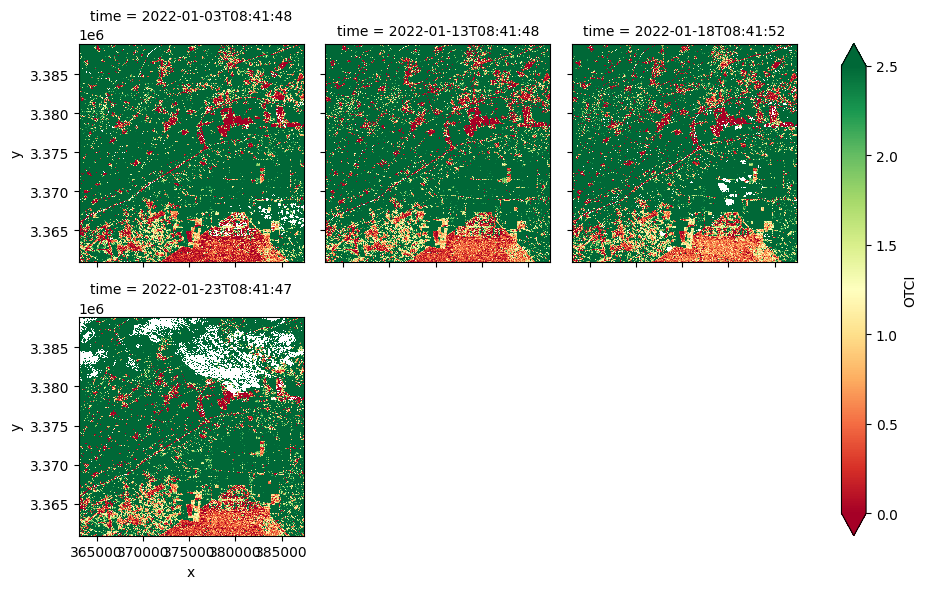

In [14]:
# Plot the OTCI results 
ds_multi.OTCI.plot(col='time',vmin=0, vmax=2.5, robust=True, cmap='RdYlGn', col_wrap=3)

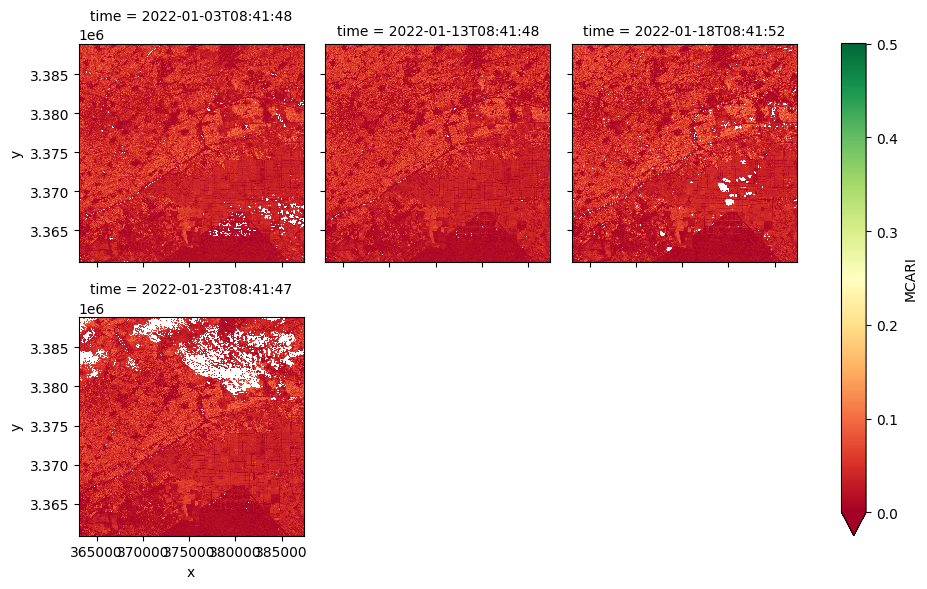

In [15]:
# Plot the MCARI results 
ds_multi.MCARI.plot(col='time',vmin=0, vmax=0.5, robust=True, cmap='RdYlGn', col_wrap=3)

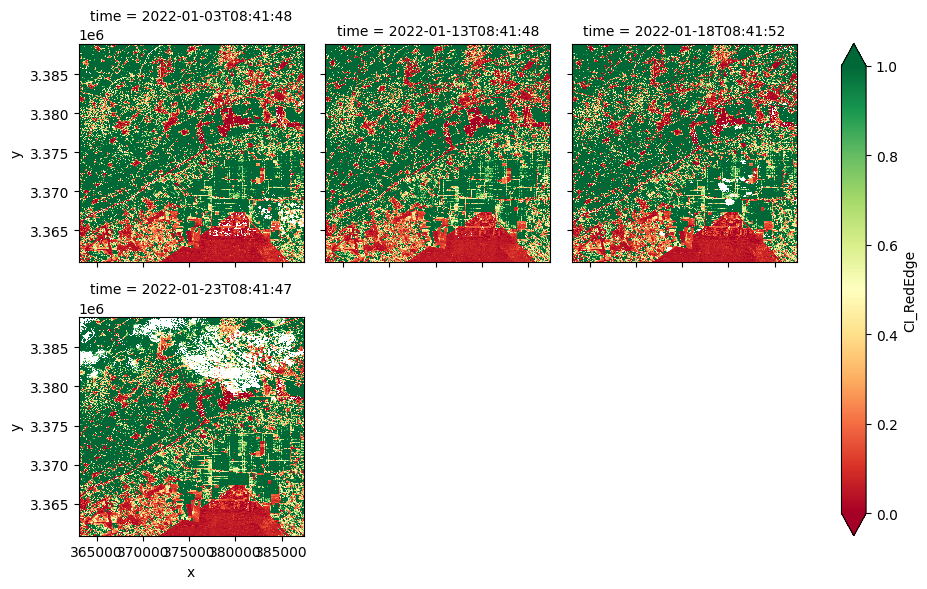

In [16]:
# Plot the CI-RedEdge results 
ds_multi.CI_RedEdge.plot(col='time',vmin=0, vmax=1, robust=True, cmap='RdYlGn', col_wrap=3)

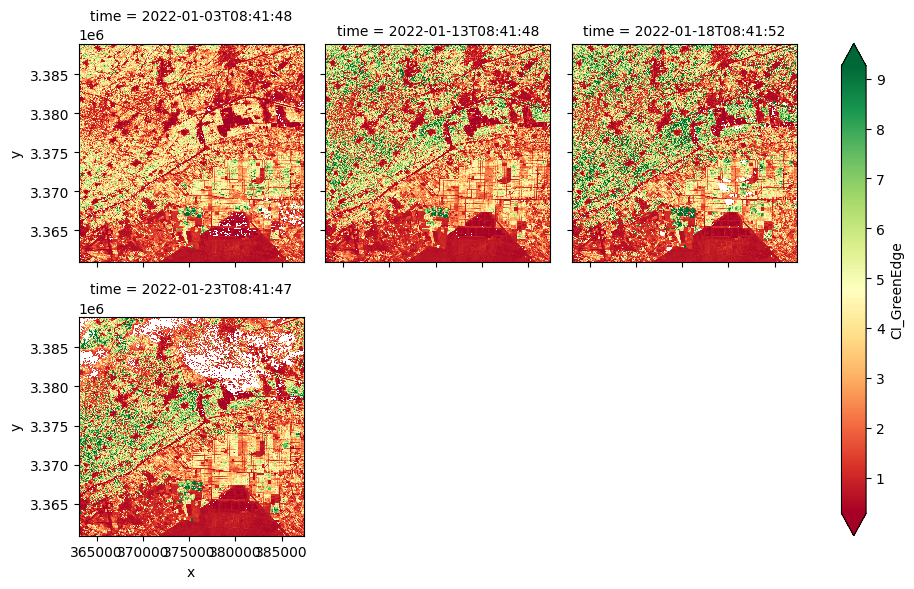

In [17]:
# Plot the CI-GreenEdge results 
ds_multi.CI_GreenEdge.plot(col='time', robust=True, cmap='RdYlGn', col_wrap=3)

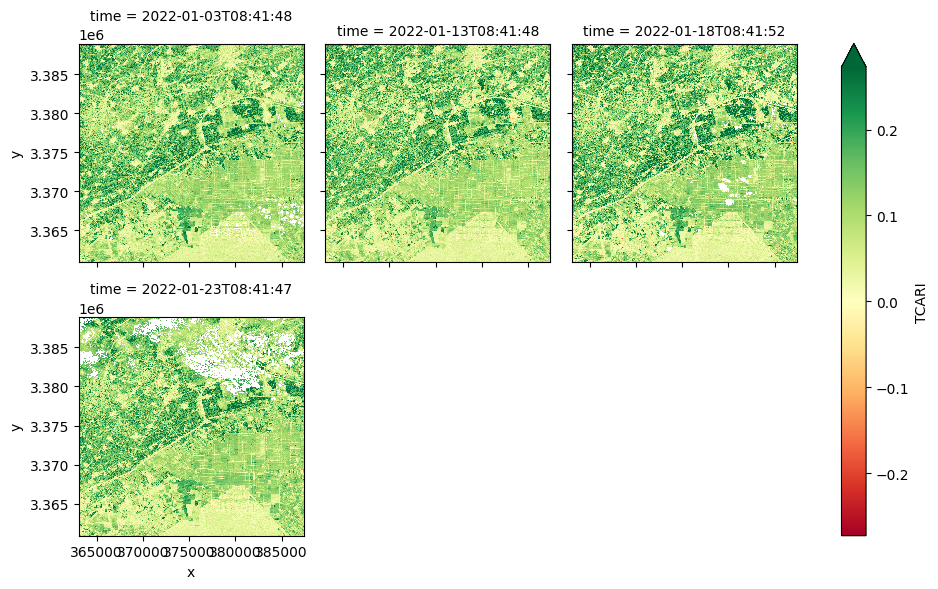

In [18]:
# Plot the TCARI results 
ds_multi.TCARI.plot(col='time', robust=True, cmap='RdYlGn', col_wrap=3)

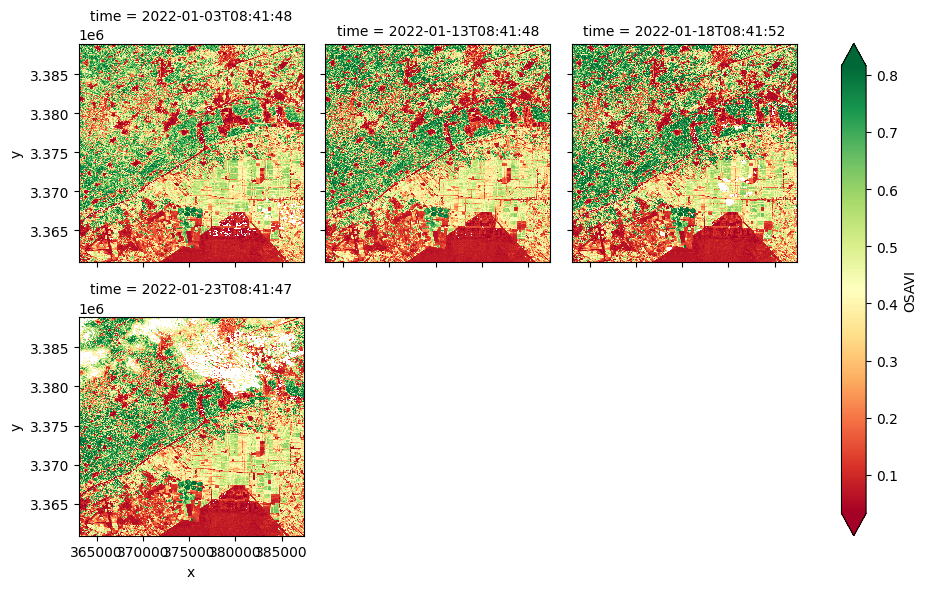

In [19]:
# Plot the OSAVI results 
ds_multi.OSAVI.plot(col='time', robust=True, cmap='RdYlGn', col_wrap=3)

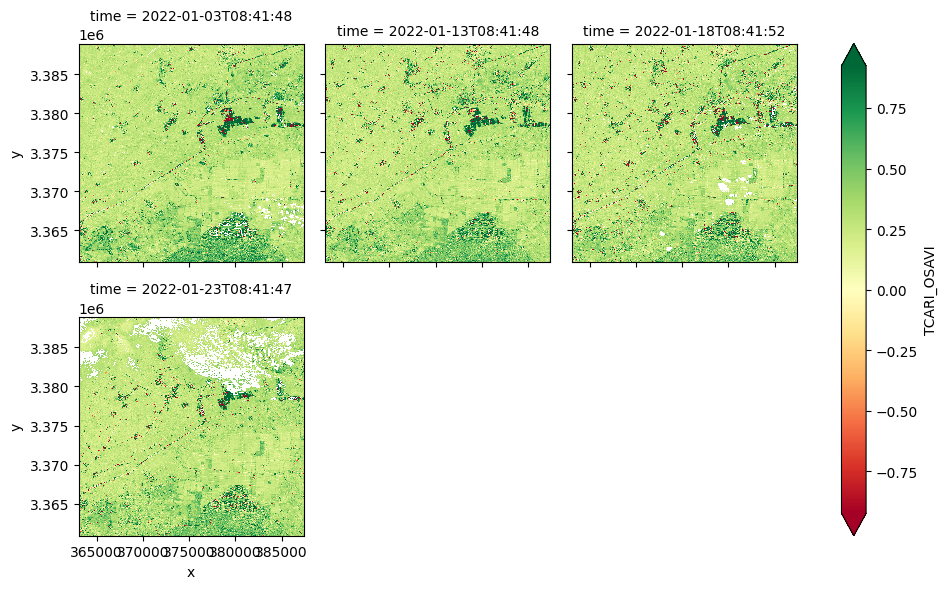

In [20]:
# Plot the TCARI_OSAVI results 
ds_multi.TCARI_OSAVI.plot(col='time', robust=True, cmap='RdYlGn', col_wrap=3)

In [21]:
# Calculate multiple indices and drop original bands
ds_drop = calculate_indices(ds, index=['NDVI', 'NDCI', 'IRECI', 'MTCI', 'OTCI', 'MCARI'
                                       , 'CI_RedEdge', 'CI_GreenEdge', 'TCARI', 'OSAVI', 'TCARI_OSAVI']
                            , drop=True, satellite_mission='s2')
print(ds_drop)

Dropping bands ['red', 'green', 'blue', 'red_edge_1', 'red_edge_2', 'red_edge_3', 'nir', 'NDVI_manual']
<xarray.Dataset>
Dimensions:       (time: 4, y: 934, x: 811)
Coordinates:
  * time          (time) datetime64[ns] 2022-01-03T08:41:48 ... 2022-01-23T08...
  * y             (y) float64 3.389e+06 3.389e+06 ... 3.361e+06 3.361e+06
  * x             (x) float64 3.631e+05 3.631e+05 ... 3.873e+05 3.874e+05
    spatial_ref   int32 32636
Data variables:
    NDVI          (time, y, x) float32 0.9016 0.8293 0.8677 ... 0.1822 0.1015
    NDCI          (time, y, x) float32 0.6429 0.4872 0.5526 ... 0.07709 0.0419
    IRECI         (time, y, x) float32 1.977 1.235 1.37 ... 0.1067 0.02806
    MTCI          (time, y, x) float32 3.388 3.252 3.09 ... 1.005 1.171 0.2542
    OTCI          (time, y, x) float32 6.777 6.504 6.18 ... 2.01 2.342 0.5083
    MCARI         (time, y, x) float32 0.1009 0.07354 ... 0.02108 0.00651
    CI_RedEdge    (time, y, x) float32 3.331 2.736 2.765 ... 0.2233 0.01173
    CI_G